### Laboratorium 6 - część 1/2

W pakiecie OpenCV wszystkie zadania związane z detekcją i opisem punktów kluczowych realizowane są przez zestaw specjalnych klas, dla których bazową jest `cv::Feature2D`. Jedną z wielu pochodnych tej klasy jest interesująca nas na zajęciach `cv::SIFT`, z której dokumentacją należy się zapoznać.  
Najważniejsze, co trzeba wiedzieć:
1. do konstrukcji obiektu SIFT służy metoda [`cv2.SIFT_create`](https://docs.opencv.org/4.x/d7/d60/classcv_1_1SIFT.html#ad337517bfdc068ae0ba0924ff1661131) - to do niej przekazujemy parametry detektora (w dokumentacji występuje jako `cv::SIFT::create`);
2. obsługujemy detektor przez interfejs `cv::Feature2D`, konkretnie metody [`detect`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#aa4e9a7082ec61ebc108806704fbd7887) do detekcji punktów kluczowych oraz [`compute`](https://docs.opencv.org/4.x/d0/d13/classcv_1_1Feature2D.html#ab3cce8d56f4fc5e1d530b5931e1e8dc0) do obliczania ich deskryptorów (opcjonalnie `detectAndCompute`).

Schemat użycia:
```python
sift_instance = cv2.SIFT_create()
# 'image' powinno być obrazem jednokanałowym (jeśli nie, zostanie zastosowane cvtColor z flagą COLOR_BGR2GRAY)
keypoints = sift_instance.detect(image)
keypoints, descriptors = sift_instance.compute(image, keypoints)
```

`keypoints` jest listą obiektów specjalnego typu `cv2.KeyPoint`, która **jest modyfikowana** przez `SIFT::compute`!  
`descriptors` jest natomiast macierzą float32 o wymiarach NxK, gdzie N jest liczbą punktów kluczowych, a K jest liczbą obliczonych cech.

Warto również zapoznać się z funkcją [`cv2.drawKeypoints`](https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920) w kontekście prezentacji wyników. Zwróć uwagę na flagi sterujące rysowaniem - szczególnie użyteczna jest `cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

#### Zadanie 1

Przetestuj wpływ podstawowych parametrów detektora SIFT (`contrastThreshold` i `edgeThreshold`) na uzyskiwane punkty kluczowe (liczność, lokalizacja, rozmiar), korzystając z obrazów `cells` i `lena`. Pamiętaj że ich działanie jest odwrotne (tzn. jeden odsiewa cechy "mniejsze niż", a drugi "większe niż").

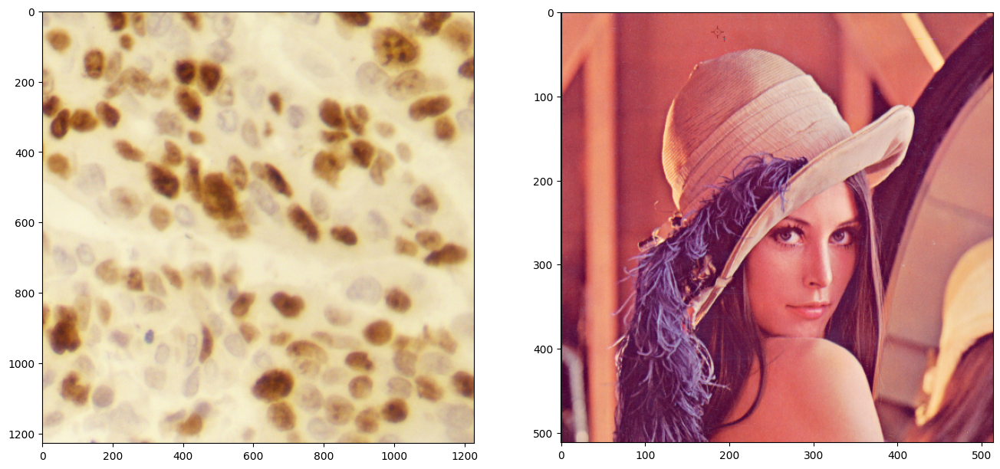

In [2]:
cells = cv2.imread('p17_0216_7.jpg')
lena = cv2.imread('Lena.jpg')
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(lena[..., ::-1]);

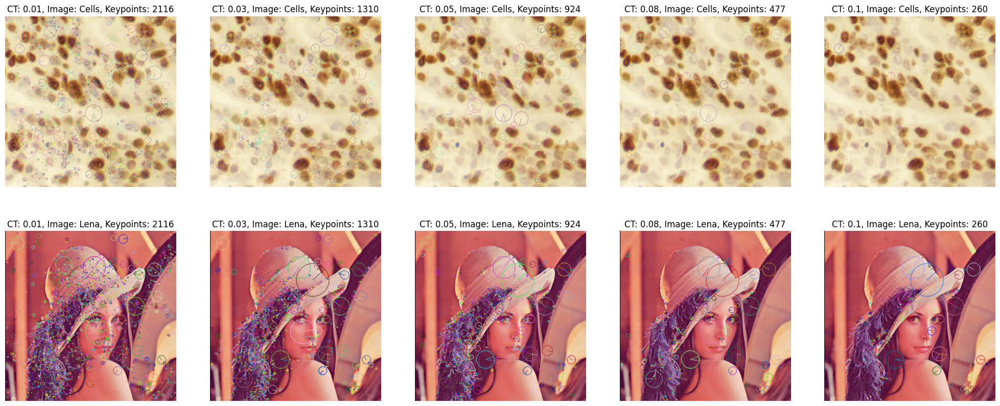

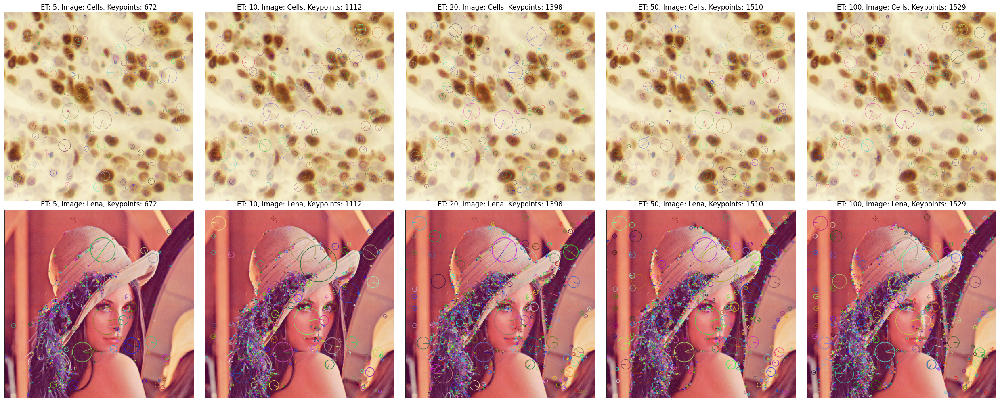

In [4]:
contrastThreshold_values = [0.01, 0.03, 0.05, 0.08, 0.1]
edgeThreshold_values = [5, 10, 20, 50, 100]

def process_images_with_sift(images, param, param_value, is_contrast):
    results = []
    for img in images:
        if is_contrast:
            sift = cv2.SIFT_create(contrastThreshold=param_value)
        else:
            sift = cv2.SIFT_create(edgeThreshold=param_value)
        keypoints, descriptors = sift.detectAndCompute(img, None)

        img_keypoints = cv2.drawKeypoints(img, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
        results.append(img_keypoints)

    return results, len(keypoints)

plt.figure(figsize=(25, 10))
for i, ct in enumerate(contrastThreshold_values):
    processed_images, keypoints = process_images_with_sift([cells, lena], 'contrastThreshold', ct, True)
    for j, img in enumerate(processed_images):
        plt.subplot(2, 5, i + 1 + j * 5)
        plt.imshow(img[..., ::-1])
        plt.title(f'CT: {ct}, Image: {"Cells" if j == 0 else "Lena"}, Keypoints: {keypoints}')
        plt.axis('off')

# Test edgeThreshold
plt.figure(figsize=(25, 10))
for i, et in enumerate(edgeThreshold_values):
    processed_images, keypoints = process_images_with_sift([cells, lena], 'edgeThreshold', et, False)
    for j, img in enumerate(processed_images):
        plt.subplot(2, 5, i + 1 + j * 5)
        plt.imshow(img[..., ::-1])
        plt.title(f'ET: {et}, Image: {"Cells" if j == 0 else "Lena"}, Keypoints: {keypoints}')
        plt.axis('off')

plt.tight_layout()
plt.show()

#### Zadanie 2

Detektor SIFT jest w teorii niezmienniczy względem translacji, rotacji czy zmiany skali. Przetestuj te własności w praktyce, oceniając wizualnie stabilność punktów wykrywanych na obróconej i przeskalowanej wersji obrazów `cells` i `lena`.

In [5]:
def rotate(image, angle, scale=1.0):
    center = (image.shape[0] // 2, image.shape[1] // 2)
    rmat = cv2.getRotationMatrix2D(center, angle, scale)
    return cv2.warpAffine(image, rmat, (image.shape[0], image.shape[1]), flags=cv2.INTER_CUBIC)

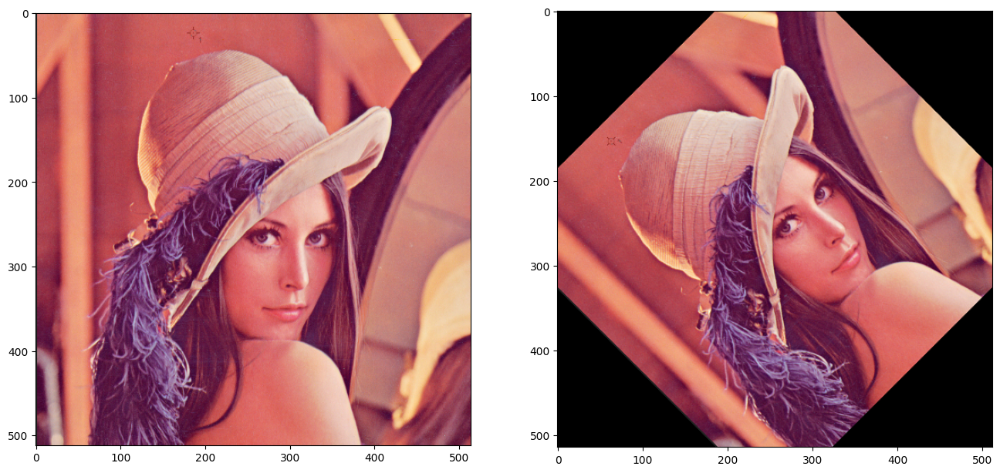

In [6]:
# przykład dla Leny, pamiętaj o cells!
lena_rot = rotate(lena, 45.0, scale=0.9)
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(lena[..., ::-1]);
a2.imshow(lena_rot[..., ::-1]);

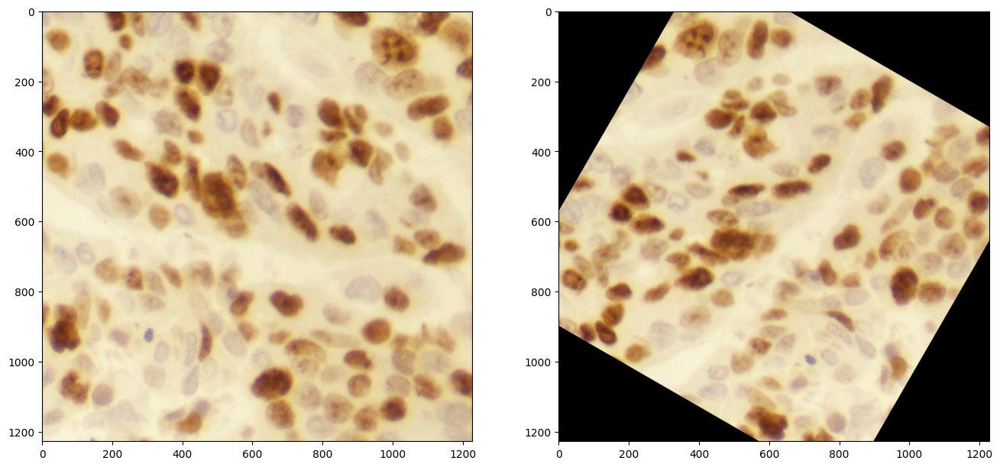

In [7]:
cells_rot = rotate(cells, 60, scale=0.9)
f, (a1, a2) = plt.subplots(1, 2, figsize=(16, 10))
a1.imshow(cells[..., ::-1]);
a2.imshow(cells_rot[..., ::-1]);

In [8]:
sift = cv2.SIFT_create()

def detect_and_draw_keypoints(image, sift):
    keypoints, _ = sift.detectAndCompute(image, None)
    return cv2.drawKeypoints(image, keypoints, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS), len(keypoints)

cells_kp, len1 = detect_and_draw_keypoints(cells, sift)
cells_rot_kp, len2 = detect_and_draw_keypoints(cells_rot, sift)
lena_kp, len3 = detect_and_draw_keypoints(lena, sift)
lena_rot_kp, len4 = detect_and_draw_keypoints(lena_rot, sift)

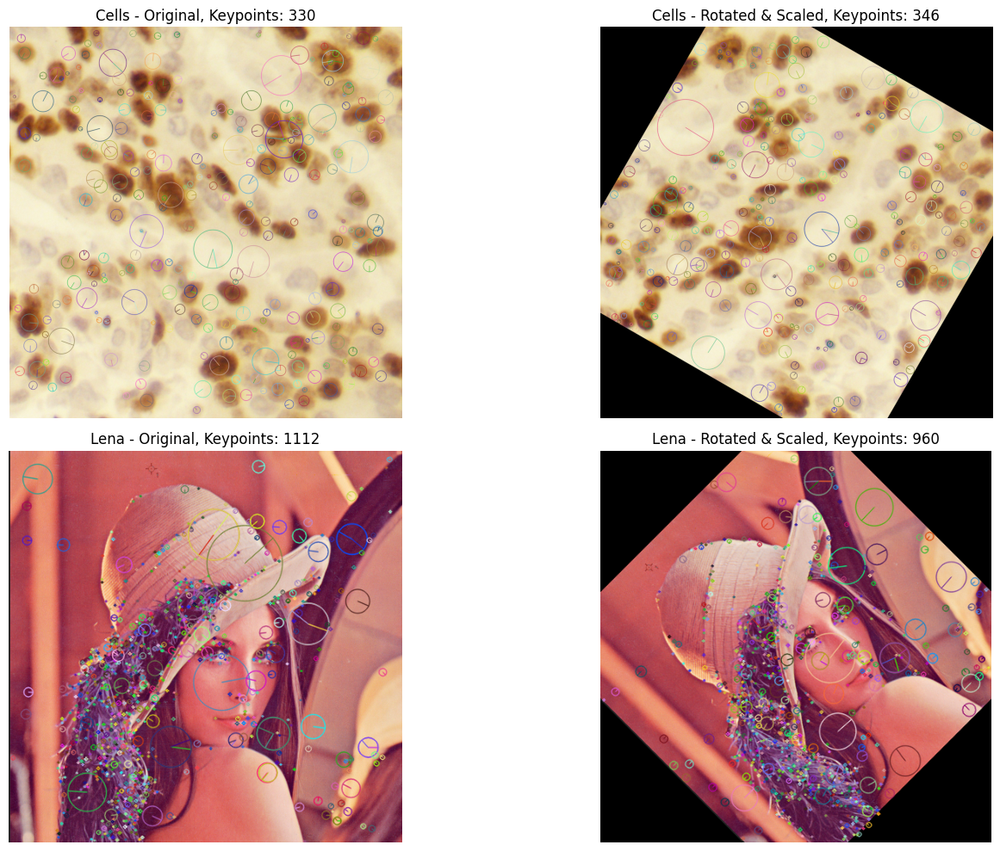

In [9]:
f, axes = plt.subplots(2, 2, figsize=(16, 10))
axes[0, 0].imshow(cells_kp[..., ::-1])
axes[0, 0].set_title(f"Cells - Original, Keypoints: {len1}")
axes[0, 1].imshow(cells_rot_kp[..., ::-1])
axes[0, 1].set_title(f"Cells - Rotated & Scaled, Keypoints: {len2}")

axes[1, 0].imshow(lena_kp[..., ::-1])
axes[1, 0].set_title(f"Lena - Original, Keypoints: {len3}")
axes[1, 1].imshow(lena_rot_kp[..., ::-1])
axes[1, 1].set_title(f"Lena - Rotated & Scaled, Keypoints: {len4}")

for ax in axes.flat:
    ax.axis('off')

plt.tight_layout()
plt.show()